In [1]:
#necessary module
import os ; import sys
sys.path.append(os.getcwd()+"/Equantum")
#path to data
datapath="/scratch/zhaoyuha/Datas/EQuantum_data/squaregate_center/"
setuppath="/scratch/zhaoyuha/Datas/EQuantum_data/squaregate_center/setup/"
from sites import Site
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
from fsc import FSC
import scipy.linalg as sl
import scipy.constants as sc
import importlib
import poissonsolver as psolver
import kwant
import scipy.io as sio

%matplotlib widget

from EQsystem import System

In [2]:
import fsc
importlib.reload(fsc)
from fsc import FSC

import EQsystem
importlib.reload(EQsystem)
from EQsystem import System
#test module


from scipy.interpolate import interp1d
from scipy.optimize import brentq

import poissonsolver
importlib.reload(poissonsolver)

<module 'poissonsolver' from '/scratch/zhaoyuha/EQuantum/EQuantum/Equantum/poissonsolver.py'>

In [3]:
import qbuilder
importlib.reload(qbuilder)
import poissonsolver
importlib.reload(poissonsolver)
import poissonsolver as psolver

In [4]:
import solvers
importlib.reload(solvers)
from solvers import local_solver

## Define system

In [5]:
def density_function(z):
        spacing0 = 0.015 # spacing at r=0
        k = 0.  # spacing increases by 0.05 per unit distance
        return spacing0 + k * z

In [5]:
def density_function(z):
        spacing0 = 0.011 # spacing at r=0
        k = 0.2  # spacing increases by 0.05 per unit distance
        if abs(z)<3*spacing0:
            return spacing0   #define same lattice for the layers above/beneath quantum system, avoid oscillation due to the lattice mismatch
        else:
            return spacing0 + k * z

In [6]:
geoparams={"lattice_type": "square",   # or honeycomb_lattice, etc.
"box_size": ((-0.6, 0.6), (-0.45, 0.45), (-0.08, 0.08)),
"sampling_density_function": density_function,
"quantum_center": (0,0,0)     # optional, defaults to (0,0,0)
              }

In [4]:
geoparams={"lattice_type": "honeycomb",   # or honeycomb_lattice, etc.
"box_size": ((-1, 1), (-1, 1), (-0.08, 0.08)),
"sampling_density_function": density_function,
"quantum_center": (0,0,0)     # optional, defaults to (0,0,0)
              }

## Initialize System

In [7]:
import os
import hashlib
import inspect

def get_geoparams_hash(params, *funcs):
    params_repr = {}
    for k, v in params.items():
        if callable(v):
            try:
                params_repr[k] = inspect.getsource(v).strip()
            except Exception:
                params_repr[k] = str(v)
        else:
            params_repr[k] = str(v)
            
    for f in funcs:
        try:
            params_repr[f.__name__] = inspect.getsource(f).strip()
        except Exception:
            pass
            
    # Sort keys for consistent hashing
    params_str = str(sorted(params_repr.items()))
    return hashlib.md5(params_str.encode()).hexdigest(), params_repr

current_hash, params_repr = get_geoparams_hash(geoparams, density_function)

hash_folder = os.path.join(setuppath, f"setup_{current_hash}")
hash_file = os.path.join(hash_folder, "geoparams_hash.txt")
sites_file = os.path.join(hash_folder, "sites.json")
readme_file = os.path.join(hash_folder, "README.txt")


generate_sites = True
if os.path.exists(hash_folder) and os.path.exists(sites_file) and os.path.exists(hash_file):
    with open(hash_file, "r") as f:
        saved_hash = f.read().strip()
    if saved_hash == current_hash:
        generate_sites = False
        print(f"Settings unchanged. Found existing setup in {hash_folder}. Skipping generation.")

if generate_sites:
    print(f"Generating new setup in {hash_folder}...")
    os.makedirs(hash_folder, exist_ok=True)
    syst=System(geoparams,assign_mat=False)
    syst.export_sites(filename=sites_file)
    with open(hash_file, "w") as f:
        f.write(current_hash)
    with open(readme_file, "w") as f:
        f.write("Parameter settings for this setup:")
        for k, v in params_repr.items():
            f.write(f"{k}:{v}")

Settings unchanged. Found existing setup in /scratch/zhaoyuha/Datas/EQuantum_data/squaregate_center/setup/setup_ae7d9fc59f6721d485f0e595c14ca989. Skipping generation.


## Initialized Setup

In [8]:
setuppathupdate=hash_folder
config_file=setuppathupdate+"/updated_sites_square.json"
syst=System(geoparams,config_file=config_file,ifqsystem=True,quantum_builder="default")

Generated 77737 points in 3D.
Voronoi cells have been created.
12 sites have been removed from the system.
The total number of sites of the current system doesn't match with the provided config file.
The quantum system has been built using the default solver.
Quantum system is generated using default.
EQsystem is successfully initialized.


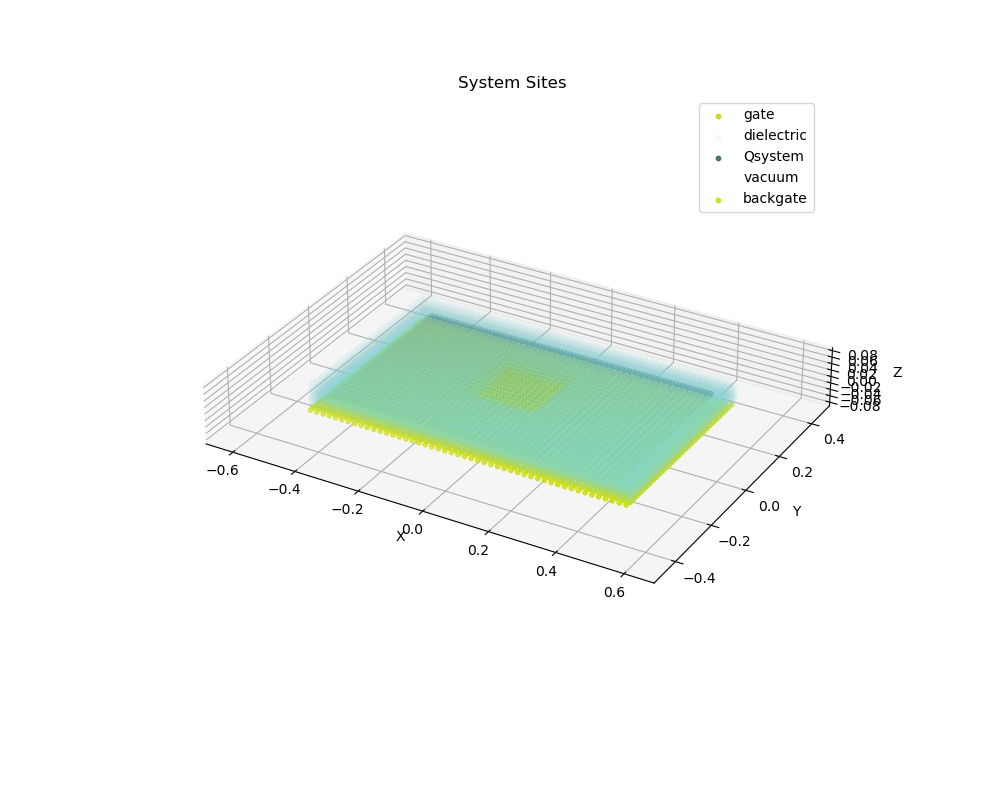

In [31]:
syst.plot_geometry()

### Initialize without blender setup (dot)

In [21]:
syst=System(geoparams,ifqsystem=True,quantum_builder="default")

Generated 42315 points in 3D.
Voronoi cells have been created.
1 sites have been removed from the system.
Quantum system is generated using default.
EQsystem is successfully initialized.


## Initialize Quantum problem

In [13]:
qparams={'Ufunc': lambda x:0,'phi':0.12}
fsc=FSC(syst,ifinitial=False,qparams=qparams)

🔄 Full Hamiltonian rebuild (qparams change)
FSC qparams: {'Ufunc': <function QuantumSystem.update_U.<locals>.Ufunc at 0x7f0f40e99ca0>, 'phi': 0.12}
QSystem params: {'Ufunc': <function QuantumSystem.update_U.<locals>.Ufunc at 0x7f0f40e99ca0>, 'phi': 0.12}
The quantum problem has been initialized.


In [14]:
fsc.update_BC(syst,'gate','potential',-1)
fsc.update_BC(syst,'dielectric','dielectric_constant',4)
fsc.update_BC(syst,'backgate','potential',2.16,ifinitial=True)

The poisson problem has been initialized.


## Check the Spectrum

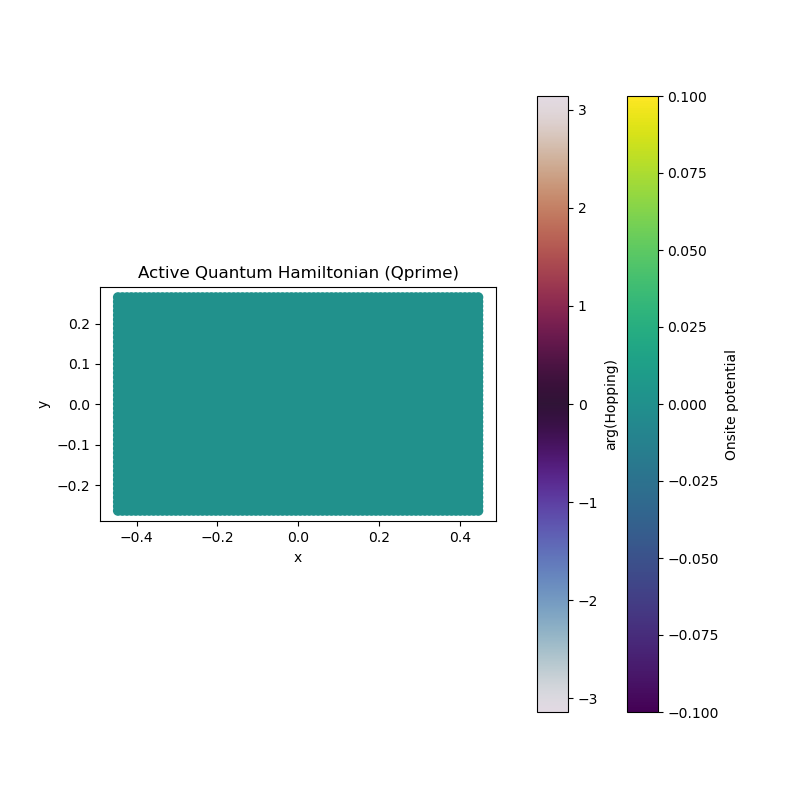

In [14]:
fsc.plot_Hamiltonian()

In [ ]:
ltest = qbuilder.update_ildos(
    fsc, syst,
    approx="ED",
    eta=0.0001,
    Ncore=20,
    M=512,
    eps=0.05,
    kernel="jackson",
)

In [21]:
Htest=fsc.qsystem.get_hamiltonian().toarray()
evals,evecs=sl.eigh(Htest)

In [31]:
ErangeT=np.linspace(emin,emax,int(fsc.qsystem.N/2))

In [29]:
emin,emax=fsc.qsystem.get_energy_bounds()

In [32]:
weights=np.abs(evecs)**2

In [63]:
dE=ErangeT[None,:]-evals[:,None]
eta=0.0001
kernal=np.exp(-0.5*(dE/eta)**2)/(np.sqrt(2*np.pi)*eta)

In [67]:
fsc.t/20

0.0001263675660416206

In [64]:
rho_all=weights@kernal

In [39]:
weights.shape

(1751, 1751)

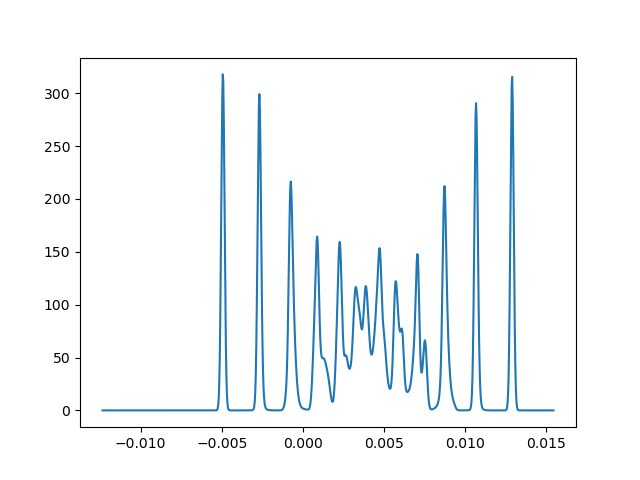

In [65]:
plt.figure()
plt.plot(ErangeT,rho_all[300,:])
plt.show()

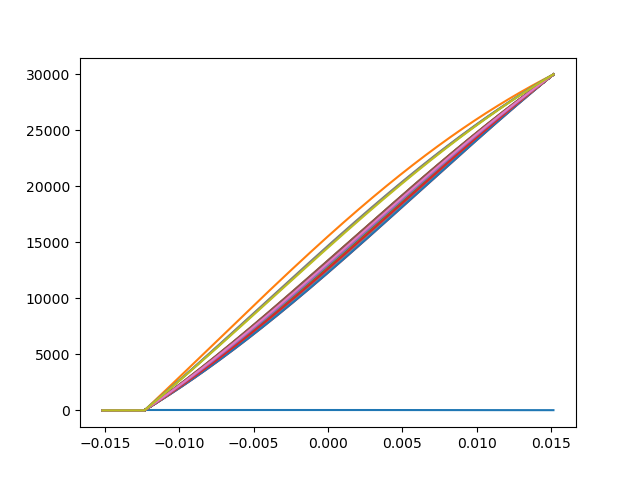

In [16]:
plt.figure()
plt.plot(ltest[1][0],ltest[1][1])
for ii in range(0,len(ltest),20):
    plt.plot(ltest[ii][0],[np.sum(ltest[ii][1][:idx]) for idx in range(len(ltest[ii][0]))])
plt.show()

In [195]:
E = np.asarray(ildos[0], dtype=float)
rho = np.asarray(ildos[1], dtype=float)

n_from_ldos = np.trapz(rho, E)
print("Integrated LDOS =", n_from_ldos)
print("ni =", ni)
print("max_fill =", fsc.max_fill)

Integrated LDOS = 313.2586733495183
ni = -168.444224033846
max_fill = 313.25867334951835


In [56]:
np.min(fsc.Ui[fsc.Qsites])

0.0

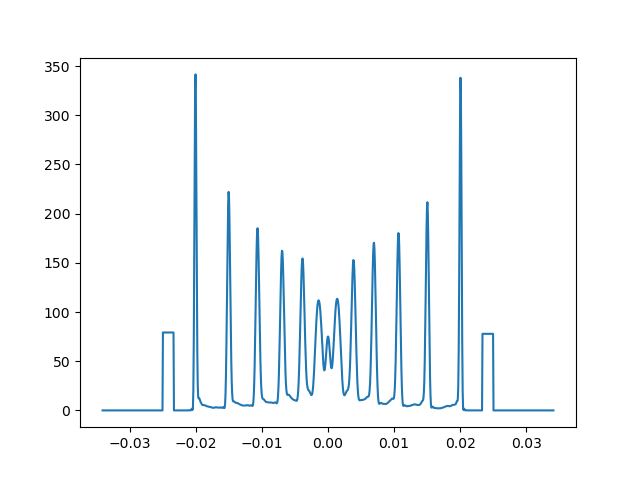

In [16]:
plt.figure()
plt.plot(x_dis,y_dis)
plt.show()

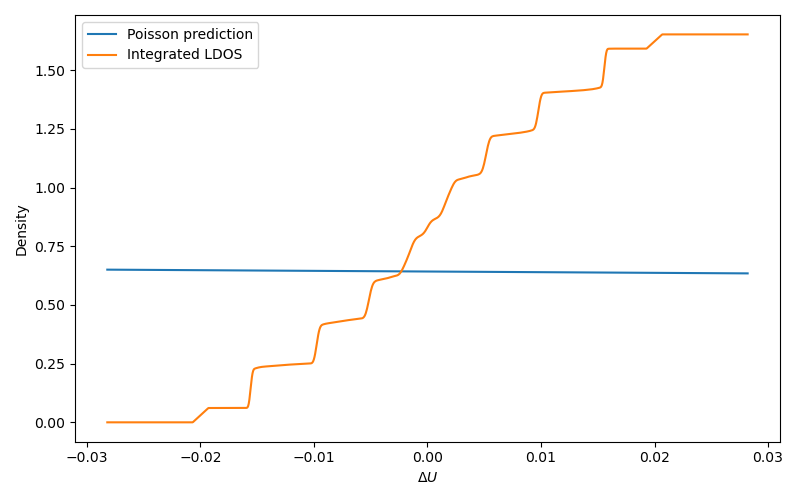

In [11]:
qidx = 2500  # index in Qprime

site_id = fsc.Qprime[qidx]
sidx = np.where(np.array(fsc.Qsites) == site_id)[0][0]

ni = fsc.ni[site_id]
Ci = fsc.Ci[qidx]
ildos = fsc.ildos[sidx]
Ui = fsc.Ui[site_id]

x_dis = np.asarray(ildos[0], dtype=float) - Ui
y_dis = np.asarray(ildos[1], dtype=float)

# cumulative integral using trapezoidal rule
ildos_dis = np.zeros_like(y_dis, dtype=float)
ildos_dis[1:] = np.cumsum(0.5 * (y_dis[1:] + y_dis[:-1]) * np.diff(x_dis))

ildos_interp = interp1d(
    x_dis,
    ildos_dis,
    kind='linear',
    fill_value='extrapolate',
    bounds_error=False
)

def dn_for_Ci(dU):
    return dU * Ci + ni

def diff(dU):
    return np.abs(dn_for_Ci(dU) - ildos_interp(dU))

plt.figure(figsize=(8, 5))
plt.plot(x_dis, [dn_for_Ci(dU) for dU in x_dis], label="Poisson prediction")
plt.plot(x_dis, ildos_dis, label="Integrated LDOS")
#plt.plot(x_dis, [diff(dU) for dU in x_dis], label="Mismatch")
plt.xlabel(r"$\Delta U$")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.show()

In [206]:
E = np.asarray(fsc.ildos[sidx][0], dtype=float)
rho = np.asarray(fsc.ildos[sidx][1], dtype=float)

print("Integral =", np.trapz(rho, E))
print("max_fill =", fsc.max_fill)

Integral = 313.2586733495183
max_fill = 313.25867334951835


In [210]:
syst.lat_spacing

0.03

In [17]:
fsc.get_energy_bounds()[1]/fsc.t

10.812728895330242

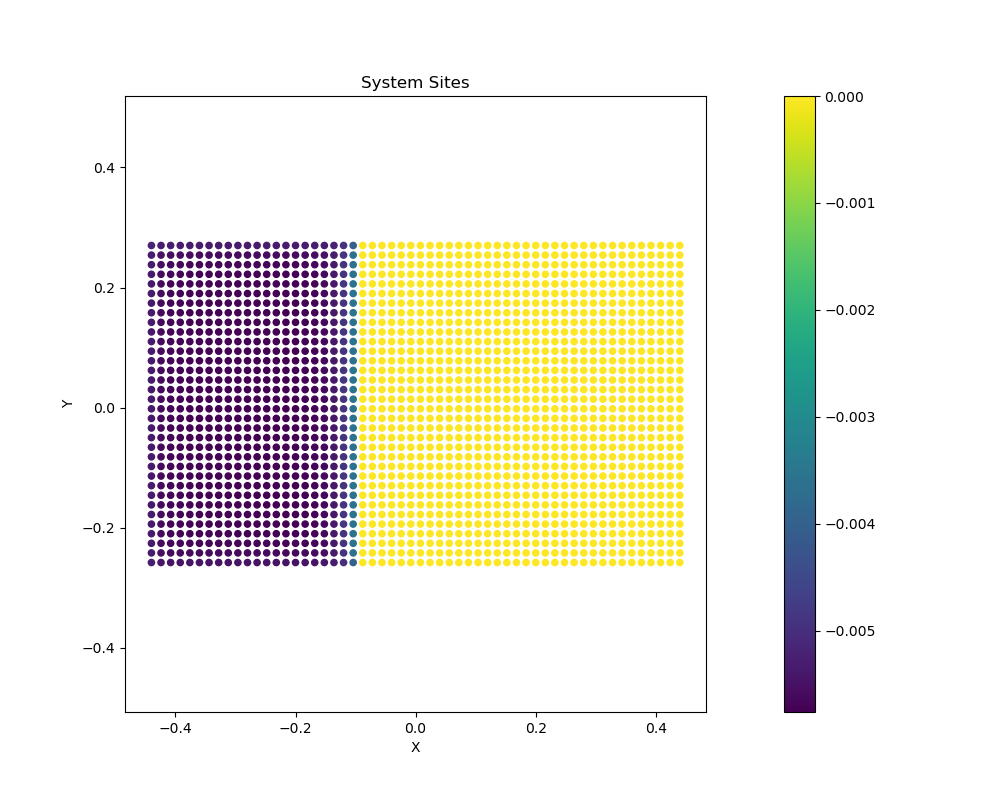

-0.0021738937848903945


In [104]:
fsc.plot_qsystem(fsc.Ui[fsc.Qsites])
print(np.mean(fsc.Ui[fsc.Qsites]))

In [22]:
E = np.asarray(ildos[0], dtype=float)
rho = np.asarray(ildos[1], dtype=float)
print(np.trapz(rho, E), fsc.max_fill)

313.2586733495183 313.25867334951835


In [28]:
Htest=fsc.qsystem.H.toarray()
pot=np.diagonal(Htest)

In [29]:
ev=np.sort(sl.eigvals(Htest))

In [31]:
ildos=qbuilder.update_ildos(
    fsc, syst,
    approx="TF",
    Ncore=20,
    M=512,
    eps=0.05,
    kernel="jackson",
)

/scratch/zhaoyuha/miniconda3/envs/equant/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


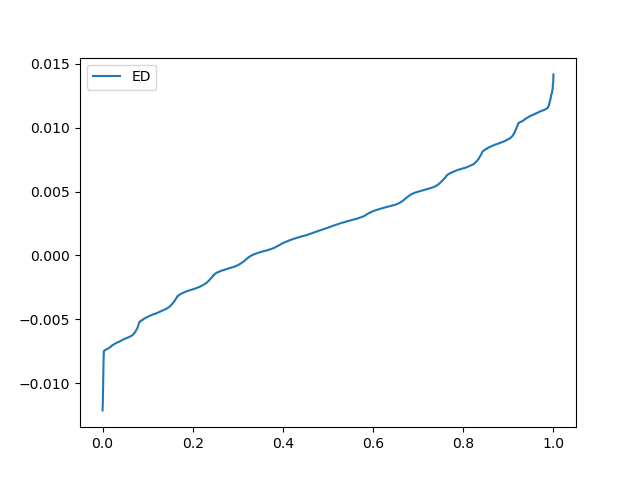

In [34]:
nden=np.array([np.sum(ildos[0][1][:idx])for idx,ee in enumerate(ildos[0][0])])
plt.figure()
plt.plot(np.linspace(0,1,len(ev)),ev,label='ED')
#plt.plot(nden/nden[-1],ildos[0][0]-fsc.energy_bounds,label='kpm')
plt.legend()
plt.show()

## Plot System

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


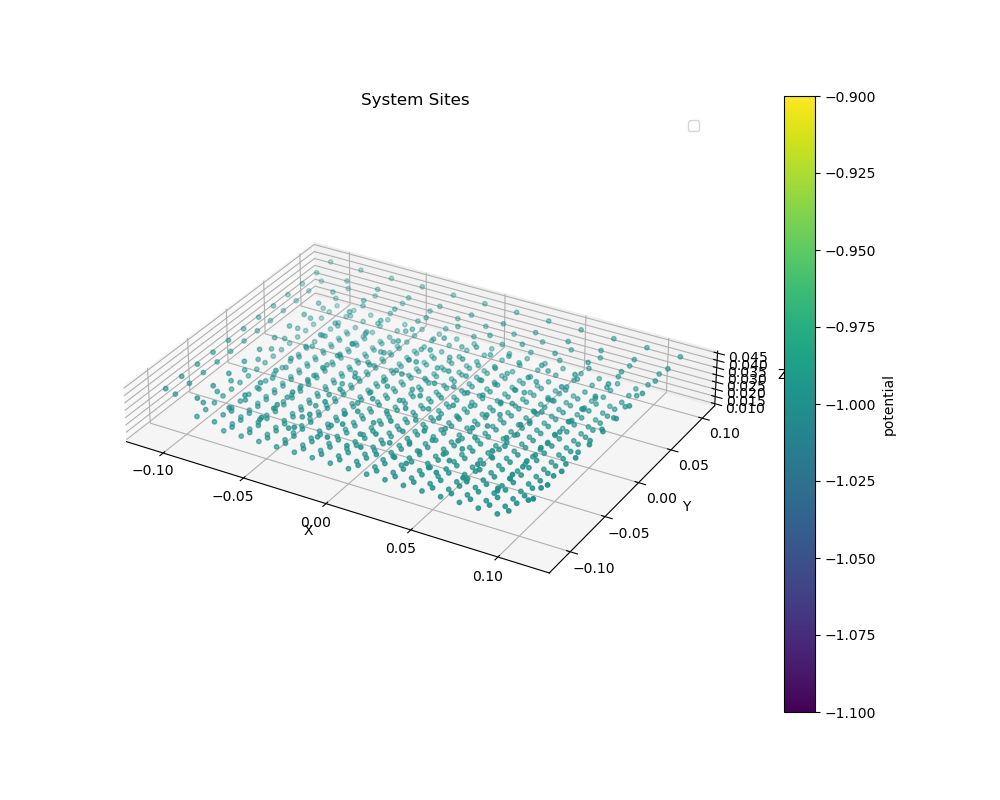

In [32]:
syst.plot_geometry(material='gate',prop='potential')

In [37]:
gateidx=np.zeros(fsc.num_sites)
for qidx, site in enumerate(fsc.sites.values()): #for all sites in the quantum system
    if site.material=='Qsystem':
        gateidx[qidx]=fsc.Ui[qidx]
gateidx[gateidx==0]='nan'

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


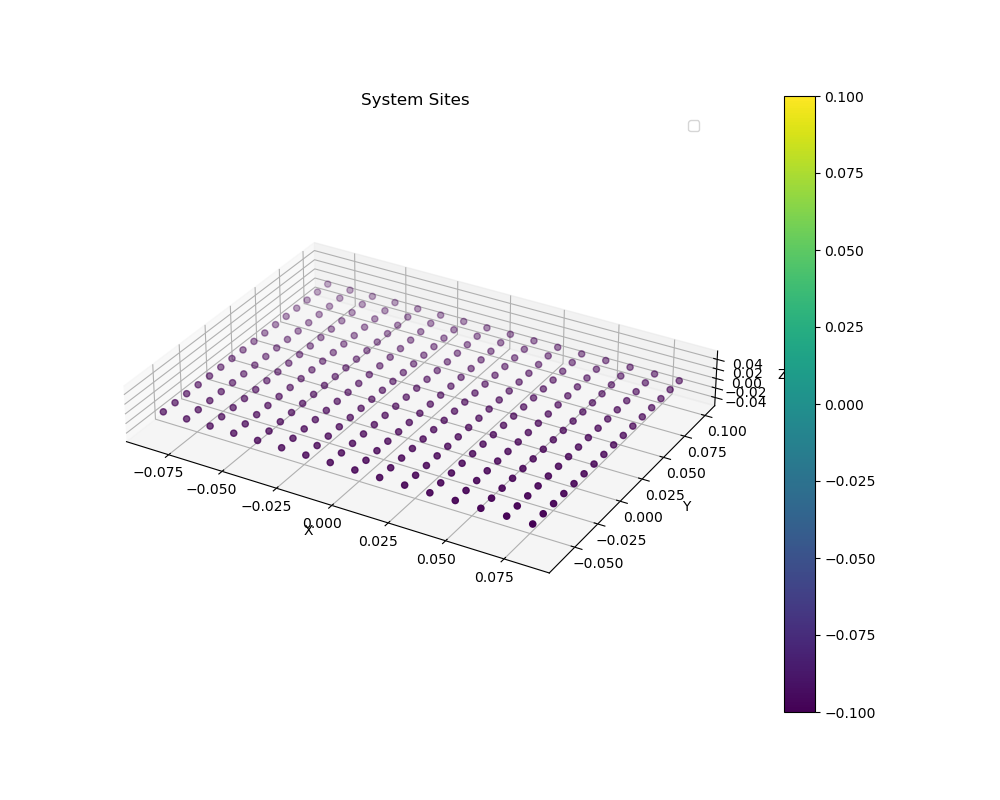

In [38]:
indicate=np.zeros(len(fsc.sites))
indicate[fsc.D_indices]=1
fsc.plot_full(gateidx)

In [94]:
num_neighbor=np.zeros(fsc.num_sites)
for qidx, idx in enumerate(fsc.Qsites): #for all sites in the quantum system
    for neighbor in fsc.sites[idx].neighbors:
        if fsc.sites[neighbor].material=='gate':  # if the neighboring sites also belongs to the Qsystem
            num_neighbor[idx]+=1


In [196]:
indicate=np.zeros(len(fsc.Qsites))
for idx in cut_idx:
    indicate[idx]=fsc.ni[fsc.Qprime][idx]

IndexError: index 7373 is out of bounds for axis 0 with size 7321

In [22]:
for neighbor in fsc.sites[fsc.Qsites[2370]].neighbors:
    print(fsc.sites[neighbor].material)

Qsystem
dielectric
dielectric
Qsystem
Qsystem


In [45]:
indicate=np.zeros(fsc.num_sites)
for idx, qidx in enumerate(fsc.Qprime):
    indicate[qidx]=fsc.Ci[idx]

/tmp/ipykernel_1024784/828773061.py:6: RuntimeWarning: invalid value encountered in log
  fsc.plot_qsystem(np.log(plotdata))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


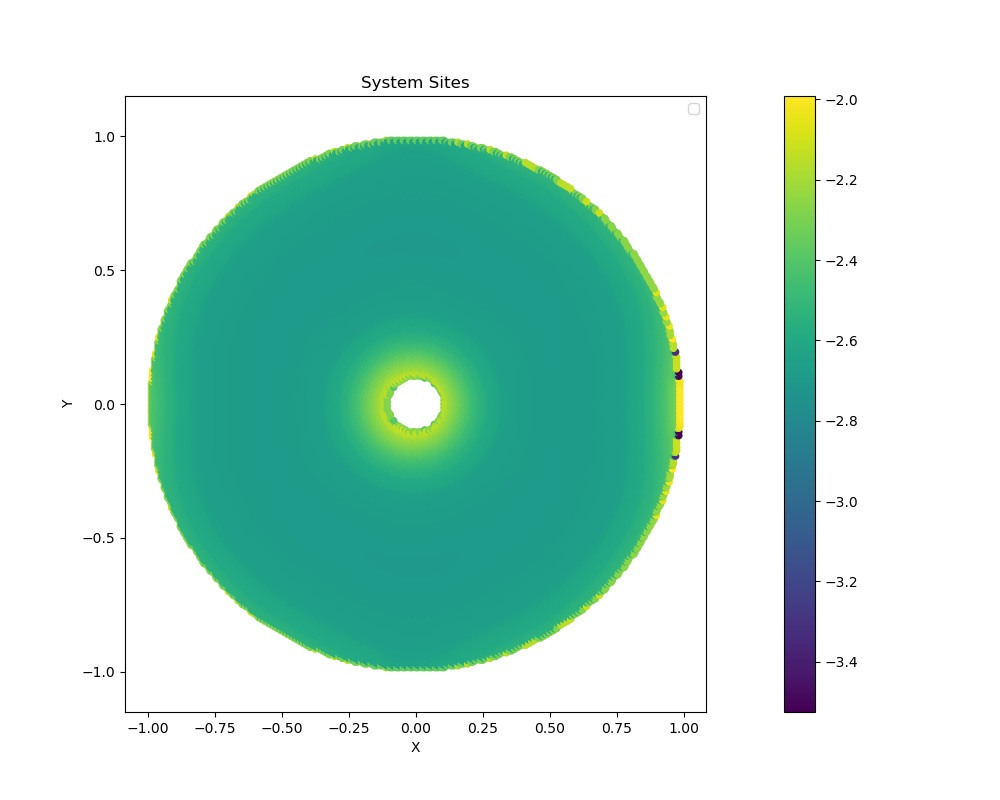

In [13]:
#indicate=np.zeros(fsc.num_sites)
#indicate[fsc.Qprime[1929]]=1
plotdata=Uis[1,:][fsc.Qsites]
#plotdata=dUdn[1]
#plotdata=pot
fsc.plot_qsystem(np.log(plotdata))

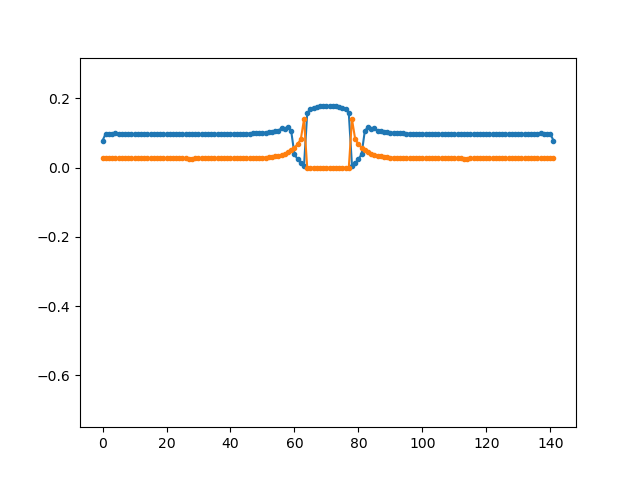

In [46]:
cut_idx=[idx for idx in range(len(fsc.Qsites)) if np.abs(fsc.sites[fsc.Qsites[idx]].coordinates[0])<0.002 and fsc.sites[fsc.Qsites[idx]].material=='Qsystem']
plt.figure()
plt.plot(Uis[-1,:][fsc.Qsites][cut_idx],'.-')
plt.plot(fsc.ni[fsc.Qsites][cut_idx],'.-')
#plt.plot(fsc.Ci[cut_idx])
plt.ylim([-0.75,2*fsc.bandwidth])
plt.show()

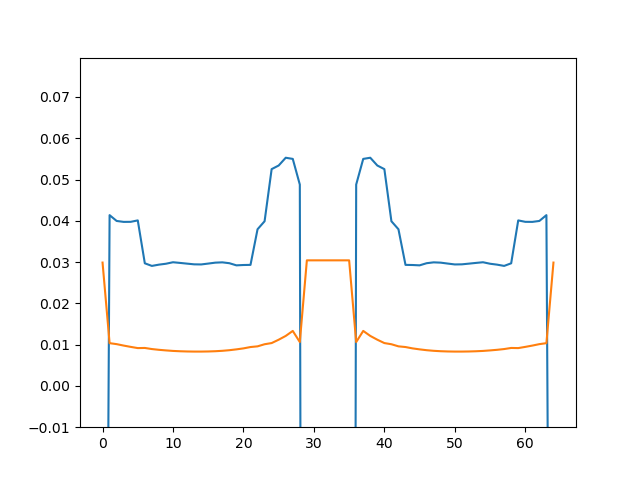

In [127]:
cut_idx=[idx for idx in range(len(fsc.Qsites)) if np.abs(fsc.sites[fsc.Qsites[idx]].coordinates[0])<0.005 and fsc.sites[fsc.Qsites[idx]].material=='Qsystem']
plt.figure()
plt.plot(fsc.Ui[fsc.Qsites][cut_idx])
plt.plot(fsc.ni[fsc.Qsites][cut_idx])
#plt.plot(fsc.Ci[cut_idx])
plt.ylim([-0.01,fsc.bandwidth])
plt.show()

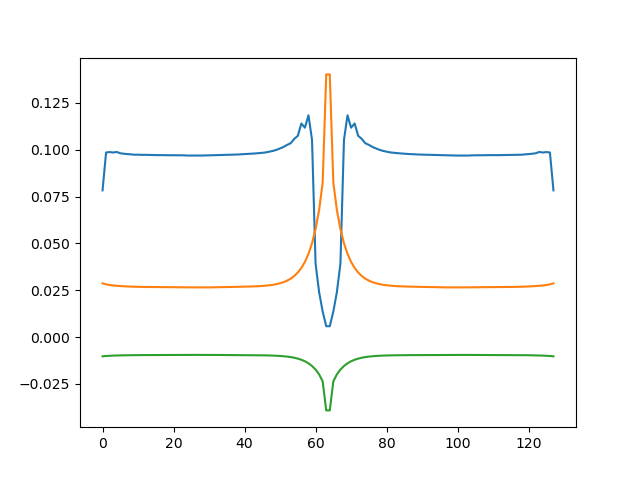

In [47]:
cut_idx=[idx for idx in range(len(fsc.Qprime)) if np.abs(fsc.sites[fsc.Qprime[idx]].coordinates[0])<0.002 and fsc.sites[fsc.Qprime[idx]].material=='Qsystem']
plt.figure()
plt.plot(Uis[-1,:][fsc.Qprime][cut_idx])
plt.plot(fsc.ni[fsc.Qprime][cut_idx])
plt.plot(0.1*fsc.Ci[cut_idx])
plt.show()

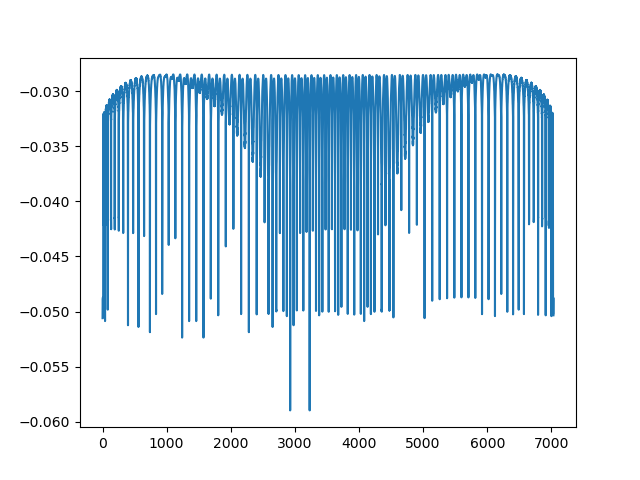

In [72]:
plt.figure()
#plt.plot(fsc.Ui[fsc.Qprime][cut_idx])
#plt.plot(fsc.ni[fsc.Qprime][cut_idx])
plt.plot(fsc.Ci)
plt.show()

## Solve FSC

In [13]:
fsc.Ncore=20
fsc.convergence_tol=2e-2
fsc.solve(
    syst,
    save=True,
    snapshot_mode="step",
    snapshot_every=1,
    snapshot_folder=setuppathupdate+"/fsc_logs_ED_phi_0.12_Vg_2.16_e_4_alpha_0.8",
    save_ildos=True,
    ldos_method="ED",
    eta=0.00015,
    M=256,
    eps=0.05,
    kernel="jackson",
)

Iteration counts: [0, 0, 0]

--- Iteration 0 ---
Qprime size   : 3546
max |ΔU|      : 5.951e-14
max |ΔU| norm  : 1.576e-12
max |Δn|      : 1.808e-13
max |Δn| norm  : 1.297e-12
-0.001087971621510817 0.0004213832137716307
Iteration counts: [0, 0, 1]

--- Iteration 1 ---
Qprime size   : 3546
max |ΔU|      : 2.946e-03
max |ΔU| norm  : 1.549e-01
max |Δn|      : 1.204e-02
max |Δn| norm  : 7.171e-02
max |ΔILDOS|  : 5.263e+02
last Poisson  : 11.255 s
last Quantum  : 12.904 s
-0.0005568675872330149 0.00020838841594391662
Iteration counts: [0, 1, 1]

--- Iteration 2 ---
Qprime size   : 3546
max |ΔU|      : 1.285e-03
max |ΔU| norm  : 7.521e-02
max |Δn|      : 3.147e-03
max |Δn| norm  : 3.611e-02
max |ΔILDOS|  : 5.263e+02
last Poisson  : 11.476 s
last Quantum  : 12.904 s
-0.0004452951598617866 0.0001667314533478514
Iteration counts: [0, 2, 1]

--- Iteration 3 ---
Qprime size   : 3546
max |ΔU|      : 1.028e-03
max |ΔU| norm  : 6.015e-02
max |Δn|      : 2.476e-03
max |Δn| norm  : 2.838e-02
max |ΔILD

In [ ]:
fsc.Ncore=20
fsc.convergence_tol=1e-6
fsc.solve(syst,save=datapath+"test")

In [36]:
fsc.Ncore=20

In [37]:
fsc.update_Qprime()

In [38]:
fsc.local_solver()

-0.00976872442057818 0.003519583883086961


In [39]:
fsc.log

{'ni_error': [1, 24.568674679891114, -4.7598967148723606e-18, 0.0],
 'Qprime_len': [1904, 1143],
 'ildos_error': [1]}

In [40]:
fsc.update_Poisson()

In [ ]:
fsc.update_Quantum(syst,approx="kmeanssample",Ncore=20,num_sample=20)

In [42]:
fsc.ildos.shape

(1904, 2, 952)

In [43]:
qbuilder.update_U(fsc,syst)

In [46]:
ildostest=qbuilder.update_ildos(fsc,
            syst,
            M=256,
            eps=0.05,
            kernel="jackson"
        )

In [47]:
Erange=np.linspace(-fsc.bandwidth,fsc.bandwidth,int(len(fsc.Qsites)/2))

AttributeError: 'FSC' object has no attribute 'bandwidth'

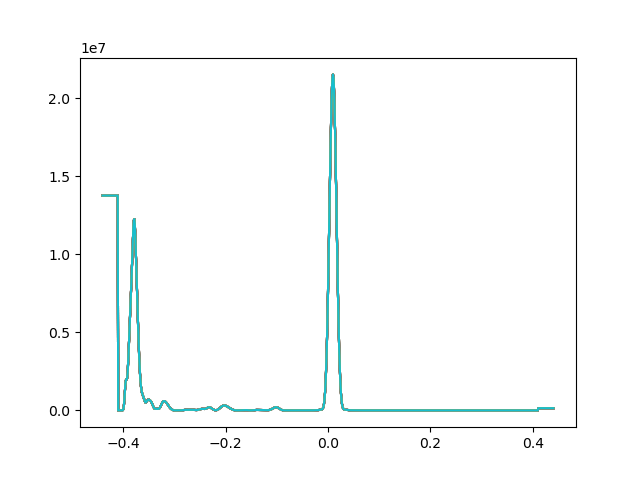

In [51]:
plt.figure()
for ii in range(1,1904,100):
    plt.plot(ildostest[ii,0,:],ildostest[ii,1,:])
plt.show()

In [44]:
fsc.ni[fsc.Qsites]=qbuilder.get_n_from_ildos(fsc,fsc.ildos)

AttributeError: module 'fsc' has no attribute 'ildos'

In [215]:
fsc.ildos[0][0]

array([0.00000000e+00, 1.04091616e-04, 2.08183231e-04, ...,
       2.54295817e-01, 2.54399908e-01, 2.54504000e-01])

In [94]:
num_sample=20
center = np.array([0.,0.,0.])
site_radii=[]
# Compute radial distances for each site (x-y plane)
for site in syst.qsystem.Qsites:
    coord = np.array(site.coordinates)
    # Compute radial distance in x-y plane relative to center
    r = np.linalg.norm(coord[:2] - center[:2])
    site_radii.append(r)

# Gather all radial distances.
site_radii = np.array(site_radii)

# Define radial bins (n+1 bin edges for n bins)
r_min, r_max = site_radii.min(), site_radii.max()
bins = np.linspace(r_min, r_max, num_sample + 1)

In [120]:
bins[20]

0.4499238444104585

In [126]:
bins[0]

0.0024996755353666367

In [129]:
np.argmax(site_radii)

12

In [138]:
[np.where((site_radii>=bins[num_sample]))[0]]

[array([  12, 3041])]

In [146]:
np.where((site_radii>=bins[num_sample]))[0]

array([  12, 3041])

In [163]:
site_in_b[-1]

array([  12, 3041])

In [174]:
site_in_b=[np.where((site_radii >= bins[b]) & (site_radii < bins[b+1]))[0] for b in range(num_sample)]
site_in_b[-1]=np.append(site_in_b[-1],np.where((site_radii>=bins[num_sample]))[0])
def calculate_ldos_in_bin(bidx,**kwargs):
    indices=site_in_b[bidx]
    rep_site = indices[int(len(indices)/2)]
    ldos_value = syst.qsystem.get_dos(i=rep_site,**kwargs)
    return ldos_value

In [173]:
np.where((site_radii>=bins[num_sample]))[0]

array([  12, 3041])

In [99]:
from joblib import Parallel, delayed

In [103]:
bin_ldos=Parallel(n_jobs=20)(delayed(calculate_ldos_in_bin)(bidx,delta=fsc.t/20,w=np.linspace(-fsc.bandwidth,fsc.bandwidth,int(len(fsc.Qsites)/2))) for bidx in range(num_sample))

In [179]:
dataall=[]

In [180]:
for bidx in range(num_sample):
    dataall.append(np.array([bin_ldos[bidx] for _ in range(len(site_in_b[bidx]))]))

In [176]:
np.sum([len(site_in_b[bidx]) for bidx in range(20)])

4892

In [194]:
sortidx=np.argsort(np.concatenate([(site_in_b[bidx]) for bidx in range(20)]))

In [192]:
set(range(4892))-set(np.concatenate([(site_in_b[bidx]) for bidx in range(20)]))

set()

In [206]:
dataalll=np.array(np.concatenate(dataall)[sortidx])

In [208]:
dataalll[:,1,:]*=fsc.max_fill
dataalll[:,0,:]+=fsc.bandwidth

In [209]:
fsc.ildos=dataalll

In [27]:
import quantum_solvers
importlib.reload(quantum_solvers)
from quantum_solvers import default_solver

In [16]:
center = np.array([0.,0.,0.])
site_radii=[]
for site in fsc.qsystem.Qsites:
    coord = np.array(site.coordinates)
    # Compute radial distance in x-y plane relative to center
    r = np.linalg.norm(coord[:2] - center[:2])
    site_radii.append(r)

In [17]:
site_radii = np.array(site_radii)      
# Define radial bins (n+1 bin edges for n bins)
r_min, r_max = site_radii.min(), site_radii.max()
bins = np.linspace(r_min, r_max, 10 + 1)

In [18]:
site_in_b=np.array([np.where((site_radii >= bins[b]) & (site_radii < bins[b+1]))[0] for b in range(10)],dtype=object)

In [29]:
np.where(np.concatenate(site_in_b)==6)

(array([], dtype=int64),)

In [26]:
np.argmax(site_radii)

6

In [25]:
bins

array([0.00249968, 0.05035184, 0.098204  , 0.14605616, 0.19390832,
       0.24176048, 0.28961264, 0.3374648 , 0.38531696, 0.43316912,
       0.48102128])

In [24]:
len(site_radii)

4904

In [37]:
def calculate_ldos_in_bin(bidx,**kwargs):
    indices=site_in_b[bidx]
    rep_site = indices[int(len(indices)/2)]
    ldos_value = fsc.qsystem.get_dos(i=rep_site,**kwargs)
    return ldos_value

In [21]:
from joblib import Parallel, delayed

In [35]:
indices=site_in_b[2]
rep_site=indices[int(len(indices)/2)]


In [ ]:
fsc.qsystem.q

2516

In [39]:
bin_ldos=Parallel(n_jobs=5)(delayed(calculate_ldos_in_bin)(bidx,delta=syst.t/20,w=np.linspace(-fsc.bandwidth,fsc.bandwidth,int(len(syst.Qsites)/2))) for bidx in range(10))

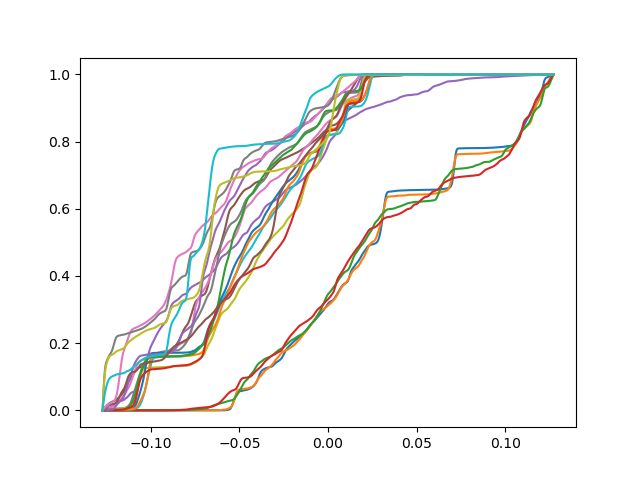

In [225]:
plt.figure()
for bb in range(len(bin_ldos)):
    #plt.plot(bin_ldos[bb][0],bin_ldos[bb][1])
    plt.plot(bin_ldos[bb][0],[np.sum(bin_ldos[bb][1][:idx]) for idx in range(len(bin_ldos[bb][0]))])
plt.show()

In [9]:
ldostest=fsc.qsystem.sample_ldos(Ncore=10)

In [51]:
cut_idx=[qidx for qidx,idx in enumerate(fsc.Qprime) if np.abs(syst.sites[idx].coordinates[0])<0.008 and syst.sites[idx].material=='Qsystem']
coords=[fsc.sites[fsc.Qprime[idx]].coordinates[1] for idx in cut_idx]

In [ ]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Color sites based on a continuous property, e.g., "charge".
ndens=[np.sum(fsc.ildos[idx,1][:ide]) for ide in range(len(fsc.ildos[idx,0]))]


coords = np.array(coords)
prop_values = np.array(prop_values)

# Create a normalization and a ScalarMappable for the colormap.
#norm = mcolors.Normalize(vmin=np.min(prop_values), vmax=np.max(prop_values))
cmap = cm.viridis
sc = ax.scatter(coords[:, 0], coords[:, 1], coords[:, 2],
                c=prop_values, cmap=cmap, s=20,vmin=np.min(prop_values), vmax=np.max(prop_values),**kwarg)
# Add a colorbar to indicate the property values.
cbar = fig.colorbar(sc, ax=ax, pad=0.1)
#cbar.set_label(prop_values)
box_size=self.geometry_params['box_size']
ax.set_box_aspect((box_size[0][1]-box_size[0][0], box_size[1][1]-box_size[1][0], box_size[2][1]-box_size[2][0]))
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
ax.set_title("System Sites")
ax.legend()
plt.show()

In [55]:
fsc.ildos[cut_idx].shape

(285, 2, 18518)

In [56]:
cut_idx

[1237,
 1238,
 1386,
 1387,
 1539,
 1540,
 1698,
 1699,
 1863,
 1864,
 2033,
 2034,
 2206,
 2207,
 2385,
 2386,
 2567,
 2568,
 2754,
 2755,
 2944,
 2945,
 3139,
 3140,
 3336,
 3337,
 3538,
 3539,
 3743,
 3744,
 3951,
 3952,
 4162,
 4163,
 4376,
 4377,
 4593,
 4594,
 4813,
 4814,
 5036,
 5037,
 5262,
 5263,
 5490,
 5491,
 5720,
 5721,
 5954,
 5955,
 6190,
 6191,
 6428,
 6429,
 6668,
 6669,
 6911,
 6912,
 7156,
 7157,
 7403,
 7404,
 7652,
 7653,
 7903,
 7904,
 8156,
 8157,
 8410,
 8411,
 8666,
 8667,
 8923,
 8924,
 9182,
 9183,
 9443,
 9444,
 9705,
 9706,
 9968,
 9969,
 10233,
 10234,
 10500,
 10501,
 10767,
 10768,
 11036,
 11037,
 11305,
 11306,
 11576,
 11577,
 11849,
 11850,
 12122,
 12123,
 12397,
 12398,
 12672,
 12673,
 12949,
 12950,
 13226,
 13227,
 13503,
 13504,
 13782,
 13783,
 14061,
 14062,
 14340,
 14341,
 14621,
 14622,
 14902,
 14903,
 15183,
 15184,
 15465,
 15466,
 15748,
 15749,
 16031,
 16032,
 16314,
 16315,
 16597,
 16598,
 16881,
 16882,
 17165,
 17166,
 17450,
 1

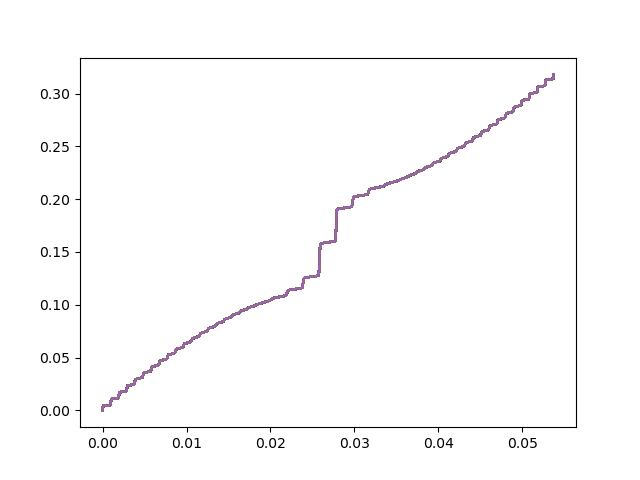

In [52]:
cut_idx=[qidx for qidx,idx in enumerate(fsc.Qsites) if np.abs(syst.sites[idx].coordinates[0])<0.005 and syst.sites[idx].material=='Qsystem']
coords=[fsc.sites[fsc.Qsites[idx]].coordinates for idx in cut_idx]

plt.figure()
for idx in cut_idx:
    nden=np.array([np.sum(fsc.ildos[idx,1][:ide]) for ide in range(len(fsc.ildos[idx,0]))])
    plt.plot(nden,fsc.ildos[idx,0])
plt.show()

In [185]:
fsc.max_fill

0.030419882641943143

In [25]:
ildoss=[[np.sum(fsc.ildos[idx,1][:ide]) for ide in range(len(fsc.ildos[idx,0]))] for idx in cut_idx]

In [27]:
positions =np.array([fsc.sites[fsc.Qsites[idx]].coordinates[1] for idx in cut_idx])    # example: 100 positions
energies = fsc.ildos[0,0,:]   
ildoss = np.array([[np.sum(fsc.ildos[idx,1][:ide]) for ide in range(len(fsc.ildos[idx,0])) ] for idx in cut_idx])
ildoss = np.transpose(ildoss) # dummy function
onsite_U=fsc.Ui[fsc.Qsites][cut_idx]

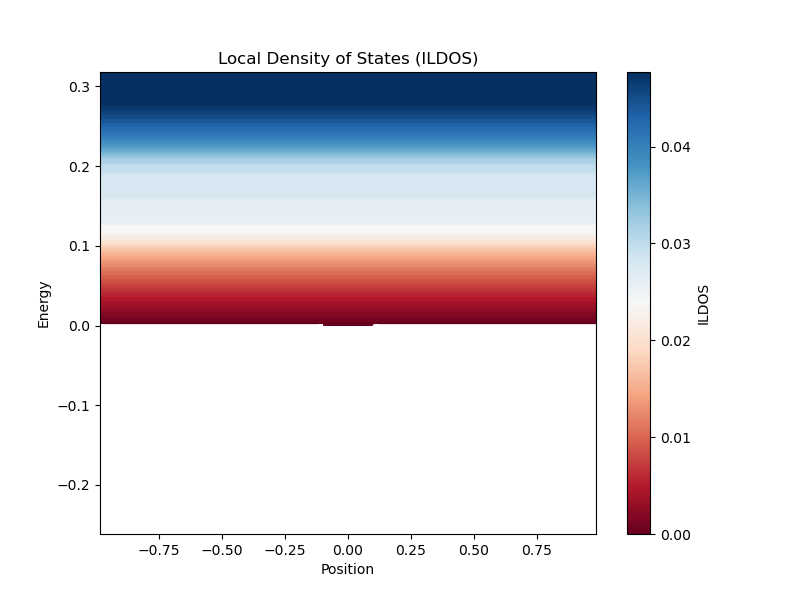

In [29]:
plt.figure(figsize=(8, 6))
# extent sets the x- and y- axes: [xmin, xmax, ymin, ymax]
plt.imshow(ildoss, extent=[positions.min(), positions.max(), energies.min(), energies.max()],
           aspect='auto', origin='lower', cmap='RdBu',vmin=0,vmax=fsc.max_fill-0.006,interpolation='none')

plt.plot(positions, onsite_U,linewidth=2,c='w')
#plt.ylim(0,0.16)
plt.colorbar(label='ILDOS')
plt.xlabel("Position")
plt.ylabel("Energy")
plt.title("Local Density of States (ILDOS)")
plt.show()

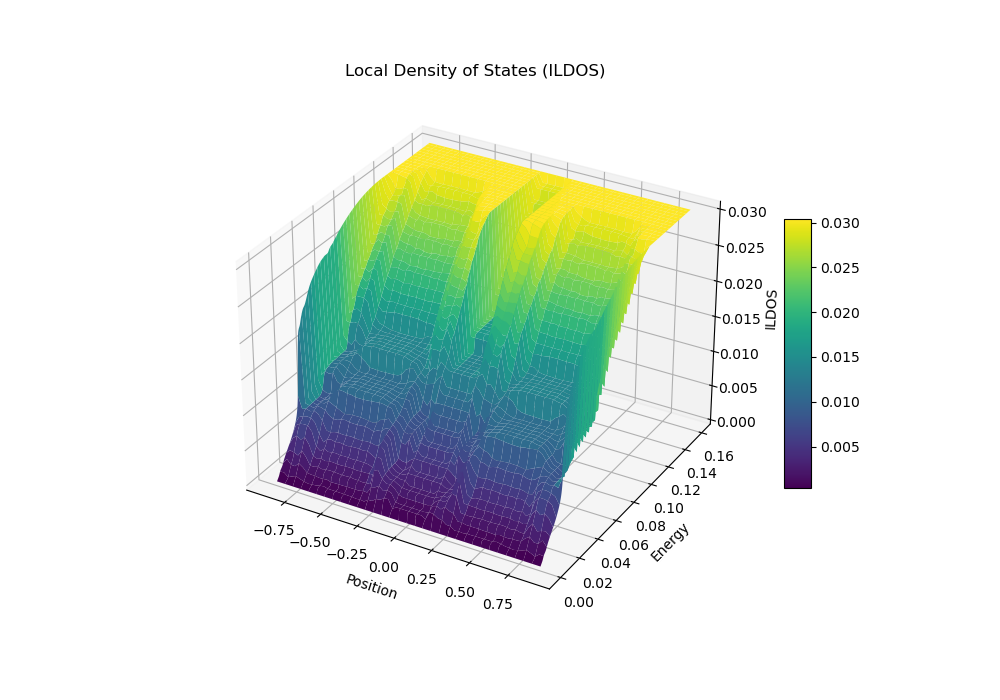

In [173]:



# Create a meshgrid from positions and energies
X, Y = np.meshgrid(positions, energies)

# Set up the figure and 3D axis
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface; adjust the colormap as desired
surf = ax.plot_surface(X, Y, ildoss, cmap='viridis', edgecolor='none')

# Label axes
ax.set_xlabel("Position")
ax.set_ylabel("Energy")
ax.set_zlabel("ILDOS")

# Add a color bar for reference
fig.colorbar(surf, shrink=0.5, aspect=10)

plt.title("Local Density of States (ILDOS)")
plt.show()

In [9]:

data=sio.loadmat("/scratch/zhaoyuha/Datas/EQuantum_data/topgate/test0008_02_graphene_diec_01")
Uis=data['Uis']
nis=data['nis']

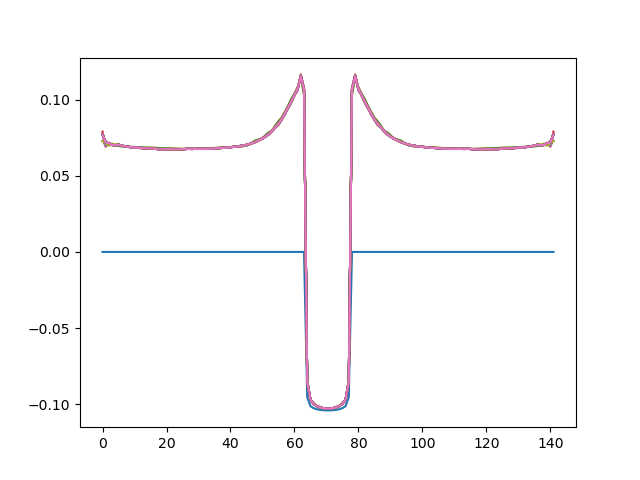

In [14]:
cut_idx=[idx for idx in range(len(syst.sites)) if np.abs(syst.sites[idx].coordinates[0])<0.002 and syst.sites[idx].material=='Qsystem']
plt.figure()
for idxu, Uii in enumerate(Uis):
    plt.plot(Uii[cut_idx])
plt.show()

## Solve FSC, step by step

In [130]:
fsc.update_BC(syst,'gate','potential',0.002)
fsc.update_BC(syst,'backgate','potential',0.003,ifinitial=True)

The poisson problem has been initialized.


In [151]:
def fsc_step(fsc, syst, do_local=True, do_qprime=True, do_poisson=True, do_quantum=True, **kw):
    import time
    import numpy as np
    import matplotlib.pyplot as plt

    print("\n==============================")
    print("Starting FSC step")
    print("==============================")

    # -------------------------
    # 1. Local solver
    # -------------------------
    if do_local:
        print("\n[Local Solver]")
        t0 = time.perf_counter()

        pre_Ui = fsc.Ui.copy()
        pre_ni = fsc.ni.copy()

        fsc.local_solver()

        print("max |ΔU|:", np.max(np.abs(fsc.Ui - pre_Ui)))
        print("max |Δn|:", np.max(np.abs(fsc.ni - pre_ni)))
        print("time:", time.perf_counter() - t0)

        fsc.plot_qsystem(fsc.Ui[fsc.Qsites], title="Ui after local")
        fsc.plot_qsystem(fsc.ni[fsc.Qsites], title="ni after local")

    # -------------------------
    # 2. Update Qprime
    # -------------------------
    if do_qprime:
        print("\n[Update Qprime]")
        old_Qprime = fsc.Qprime.copy()

        new_Qprime = solvers.update_Qprime(fsc)
        fsc.Qprime = new_Qprime
        fsc.Qp_in_Q = {ii: list(fsc.Qsites).index(qpidx) for ii, qpidx in enumerate(fsc.Qprime)}

        print("Qprime size:", len(fsc.Qprime))
        print("Removed:", len(old_Qprime) - len(fsc.Qprime))

        # visualize Qprime as mask on Qsites
        qmask = np.isin(fsc.Qsites, fsc.Qprime).astype(float)
        fsc.plot_qsystem(qmask, title="Qprime mask")

    # -------------------------
    # 3. Poisson update
    # -------------------------
    if do_poisson:
        print("\n[Poisson]")
        t0 = time.perf_counter()

        pre_Ui = fsc.Ui.copy()
        pre_ni = fsc.ni.copy()

        fsc.update_Poisson()

        print("max |ΔU|:", np.max(np.abs(fsc.Ui - pre_Ui)))
        print("max |Δn|:", np.max(np.abs(fsc.ni - pre_ni)))
        print("time:", time.perf_counter() - t0)

        fsc.plot_qsystem(fsc.Ui[fsc.Qsites], title="Ui after Poisson")

    # -------------------------
    # 4. Quantum update
    # -------------------------
    if do_quantum:
        print("\n[Quantum]")
        t0 = time.perf_counter()

        pre_ni = fsc.ni.copy()

        fsc.update_Quantum(
            syst,
            approx="kmeanssample",
            Ncore=fsc.Ncore,
            num_sample=10,
            **kw
        )

        print("max |Δn|:", np.max(np.abs(fsc.ni - pre_ni)))
        print("time:", time.perf_counter() - t0)

        fsc.plot_qsystem(fsc.ni[fsc.Qsites], title="ni after Quantum")

        # optional: show current Qprime overlay manually
        coords = np.array([fsc.sites[idx].coordinates[:2] for idx in fsc.Qsites])
        qmask = np.isin(fsc.Qsites, fsc.Qprime)

        plt.figure(figsize=(6, 5))
        plt.scatter(coords[:, 0], coords[:, 1], c=fsc.Ui[fsc.Qsites], cmap="coolwarm", s=30)
        plt.scatter(
            coords[qmask, 0],
            coords[qmask, 1],
            s=80,
            facecolors="none",
            edgecolors="black",
            linewidths=1.5,
            label="Qprime"
        )
        plt.gca().set_aspect("equal")
        plt.xlabel("x")
        plt.ylabel("y")
        plt.title("Qprime overlay on Ui")
        plt.legend()
        plt.tight_layout()
        plt.show()

    print("\nStep complete.")


Starting FSC step

[Local Solver]
-0.001476651118982316 nan
max |ΔU|: nan
max |Δn|: nan
time: 0.9067653752863407


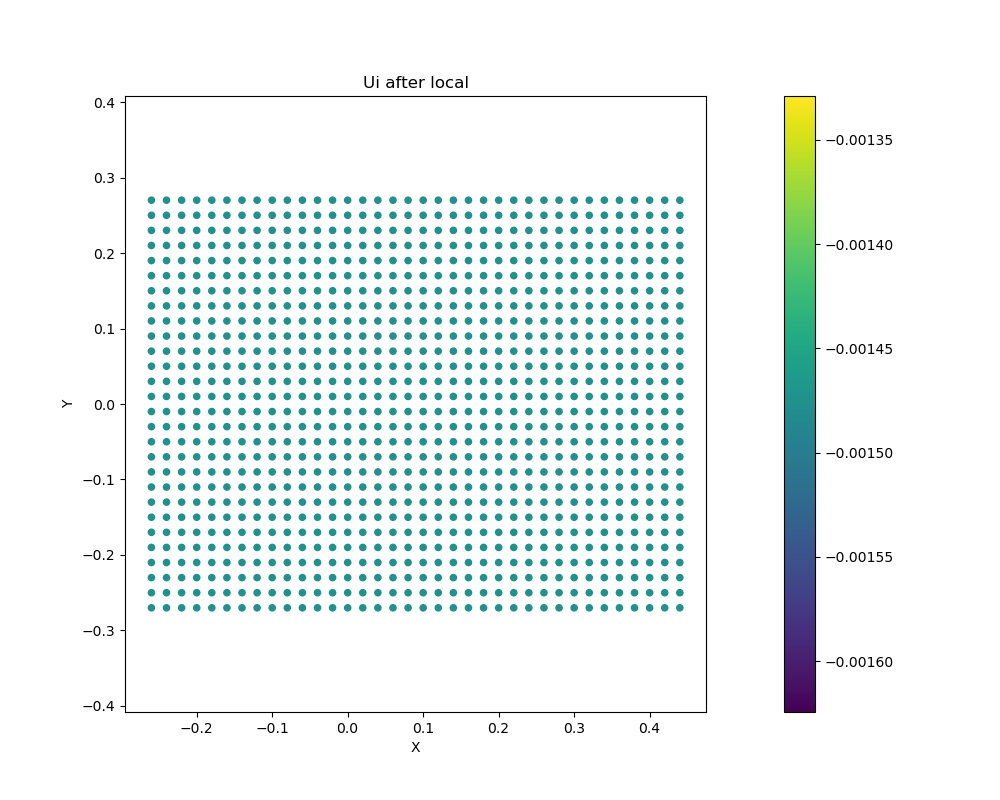

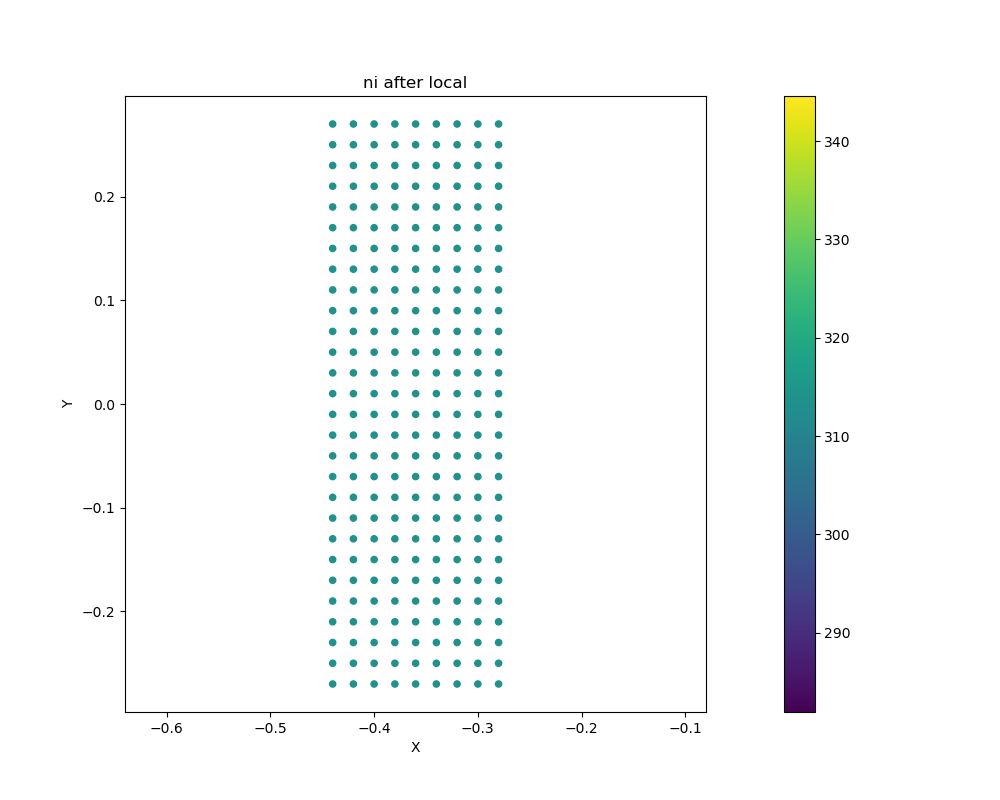


[Update Qprime]
Qprime size: 1008
Removed: 0


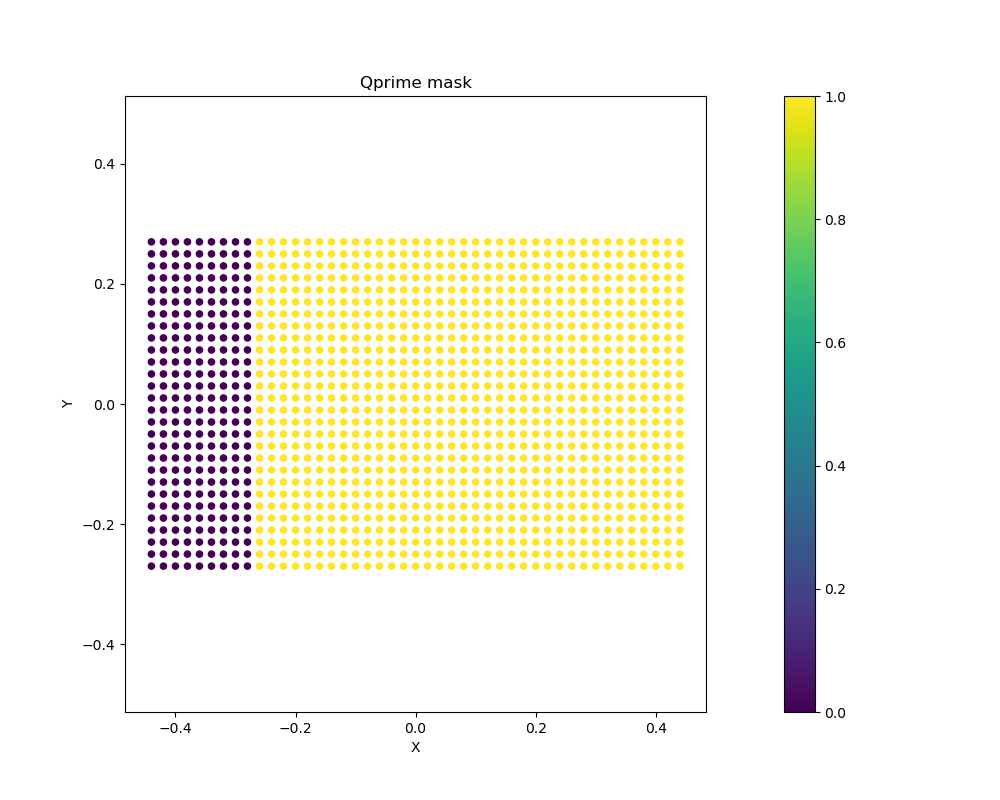


[Poisson]
max |ΔU|: nan
max |Δn|: nan
time: 0.05923891440033913


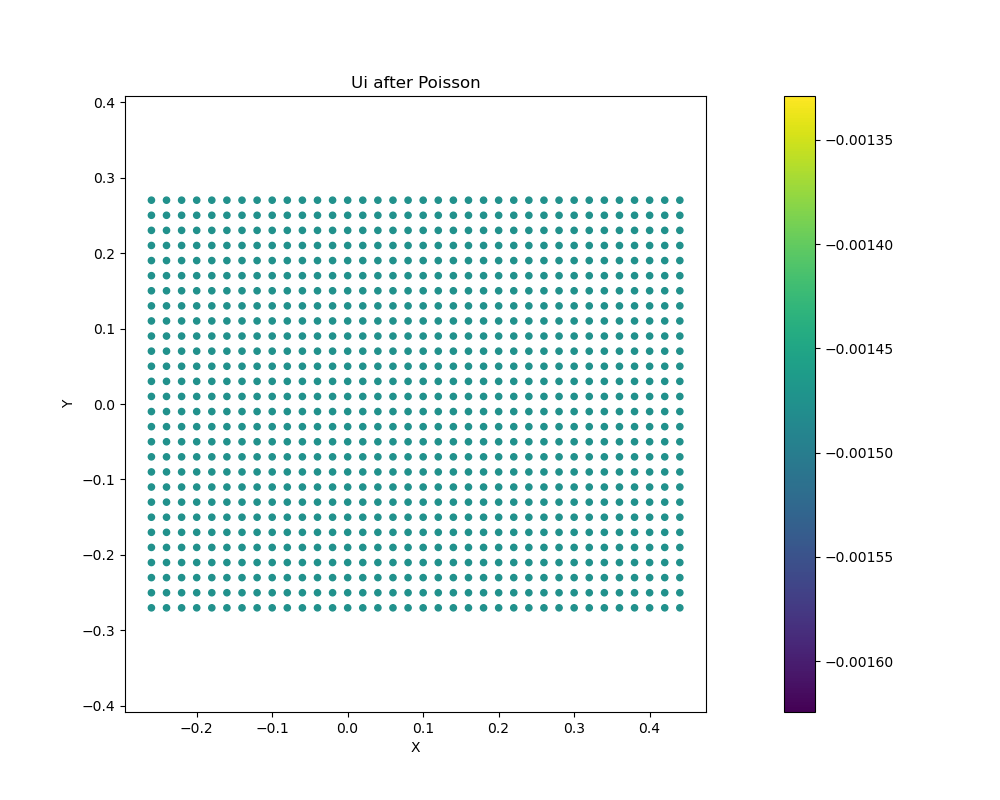


[Quantum]
[ 252  253  254 ... 1257 1258 1259]


TypeError: unsupported operand type(s) for -: 'list' and 'list'

In [152]:
fsc_step(
    fsc,
    syst,
    M=256,
    eps=0.05,
    kernel="jackson"
)

In [153]:
print(type(fsc.ildos))

<class 'list'>


In [156]:
fsc.ildos[1:]

[(array([-6.25519452e-03, -6.23530519e-03, -6.21541586e-03, -6.19552653e-03,
         -6.17563720e-03, -6.15574787e-03, -6.13585853e-03, -6.11596920e-03,
         -6.09607987e-03, -6.07619054e-03, -6.05630121e-03, -6.03641188e-03,
         -6.01652255e-03, -5.99663322e-03, -5.97674389e-03, -5.95685456e-03,
         -5.93696523e-03, -5.91707590e-03, -5.89718657e-03, -5.87729723e-03,
         -5.85740790e-03, -5.83751857e-03, -5.81762924e-03, -5.79773991e-03,
         -5.77785058e-03, -5.75796125e-03, -5.73807192e-03, -5.71818259e-03,
         -5.69829326e-03, -5.67840393e-03, -5.65851460e-03, -5.63862527e-03,
         -5.61873594e-03, -5.59884660e-03, -5.57895727e-03, -5.55906794e-03,
         -5.53917861e-03, -5.51928928e-03, -5.49939995e-03, -5.47951062e-03,
         -5.45962129e-03, -5.43973196e-03, -5.41984263e-03, -5.39995330e-03,
         -5.38006397e-03, -5.36017464e-03, -5.34028530e-03, -5.32039597e-03,
         -5.30050664e-03, -5.28061731e-03, -5.26072798e-03, -5.24083865e-03,

In [158]:
len(fsc.Qprime)

1008

In [211]:
E = np.asarray(fsc.ildos[sidx][0], dtype=float)
rho = np.asarray(fsc.ildos[sidx][1], dtype=float)

print("Integral =", np.trapz(rho, E))
print("max_fill =", fsc.max_fill)
print("bandwidth from bounds =", E.max() - E.min())

Integral = 313.2586733495183
max_fill = 313.25867334951835
bandwidth from bounds = 0.005221684968231762


In [215]:
 (E.max() - E.min())/syst.t

8.26428035578677

In [217]:
rhos = []
for site_id in fsc.Qprime[::max(1, len(fsc.Qprime)//50)]:
    sidx = np.where(np.array(fsc.Qsites) == site_id)[0][0]
    E = np.asarray(fsc.ildos[sidx][0], dtype=float)
    rho = np.asarray(fsc.ildos[sidx][1], dtype=float)
    Ui = fsc.Ui[site_id]
    rhos.append(np.interp(Ui, E, rho))

Ci0 = np.median(rhos)
print("Suggested constant Ci =", Ci0)

Suggested constant Ci = 247788.4818368034


In [26]:
qidx = len(fsc.Qprime) // 2
site_id = fsc.Qprime[qidx]
sidx = np.where(np.array(fsc.Qsites) == site_id)[0][0]

E = np.asarray(fsc.ildos[sidx][0], dtype=float)
rho = np.asarray(fsc.ildos[sidx][1], dtype=float)
Ui = fsc.Ui[site_id]
Ci = fsc.Ci[qidx]

rho0 = np.interp(Ui, E, rho)

print("site_id =", site_id)
print("Ui =", Ui)
print("Ci =", Ci)
print("rho(E_F) =", rho0)
print("Ci / rho(E_F) =", Ci / rho0 if rho0 != 0 else np.inf)

site_id = 4443
Ui = 0.0
Ci = -0.08710719984284121
rho(E_F) = 184.1790740093516
Ci / rho(E_F) = -0.00047294840801739716


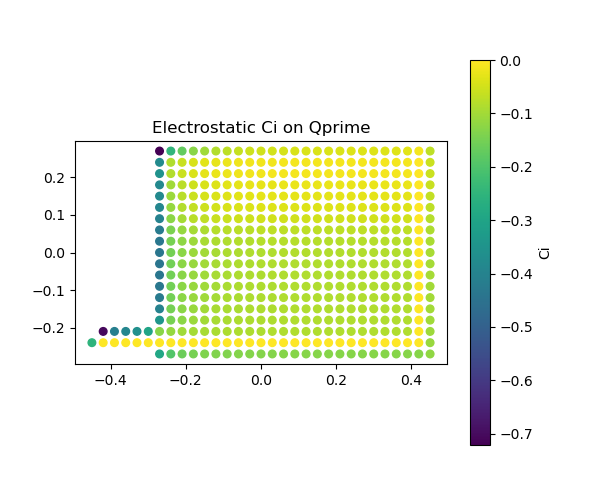

In [27]:
coords = np.array([fsc.sites[idx].coordinates[:2] for idx in fsc.Qprime])

plt.figure(figsize=(6,5))
plt.scatter(coords[:,0], coords[:,1], c=fsc.Ci, cmap="viridis", s=30)
plt.colorbar(label="Ci")
plt.gca().set_aspect("equal")
plt.title("Electrostatic Ci on Qprime")
plt.show()

In [221]:
55/fsc.unit_cell_area/1e16

6.111111111111112

In [222]:
ni

0.00013326233250753858

In [226]:
1/syst.unit_cell_area/1e16

0.11111111111111113

In [28]:
fsc.max_fill

0.22222222222222227